In [1]:
import os
import pandas as pd
import datetime as dt
from typing import NamedTuple
import math
from schema import *
import numpy as np

In [2]:
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot
import chart_studio.plotly as pl
import plotly.graph_objs as gr
import matplotlib.pyplot as plt
init_notebook_mode()


In [3]:
def plot_three_columns(title, x_header, y1_header, y2_header, y3_header, x_data, y1_data, y2_data, y3_data):
    xaxis = gr.layout.XAxis(title=x_header, titlefont=dict(size = 20))

    yaxis = gr.layout.YAxis(title=y1_header, domain=[0.0, 0.32],titlefont = dict(size = 12))
    yaxis2 = gr.layout.YAxis(title=y2_header, domain=[0.33, 0.65],titlefont = dict(size = 12))
    yaxis3 = gr.layout.YAxis(title=y3_header, domain=[0.66, 1.0],titlefont = dict(size = 12))

    layout = gr.Layout(title=title, showlegend=False,
           xaxis=xaxis, yaxis=yaxis, yaxis2=yaxis2, yaxis3=yaxis3, titlefont = dict(size = 30))

    data = [
        gr.Scatter(x=x_data, y=y1_data),
        gr.Scatter(x=x_data, y=y2_data, yaxis='y2'),
        gr.Scatter(x=x_data, y=y3_data, yaxis='y3')
    ]

    iplot(gr.Figure(data=data, layout=layout))
    return

In [4]:
def get_output_files(path):
    output_arr = []
    output_map = {}
    for d in os.listdir(path):
        for m in os.listdir(os.path.join(path, d)):
            if ('_output_' in m and not 'steady' in m):
                full_path = os.path.join(path, d, m)
                output_arr.append(full_path)
                output_map[full_path] = os.path.join(path + '_euler', d, m)
    return output_arr, output_map

def map_outputs(ids, files, new_files):
    output = {i:[] for i in ids}
    for f in files:
        output[f.split('_')[-1].rstrip('.csv')].append(f)
    return output, new_files

def get_vec(str_vec):
    return [float(i) for i in str_vec.strip('()').split(',')]

def vec2str(vec, f=False):
    if f:
        return f"({'%.3f' % vec[0]},{'%.3f' % vec[1]},{'%.3f' % vec[2]})"
    else:
        return f"({'%.8f' % vec[0]},{'%.8f' % vec[1]},{'%.8f' % vec[2]})"

def create_new_experiment_dirs(source):
    root = source + '_euler'
    for d in os.listdir(source):
        new_path = os.path.join(root, d)
        if not os.path.exists(new_path):
            os.makedirs(new_path)

In [5]:
def get_origins(path):
    a = pd.read_csv(path, sep=';')
    rotation = np.mean(np.array(a.Rotation.map(lambda a: Quaternion.from_str(a).to_euler_angles).tolist()), axis=0)
    position = np.mean(np.array(a.Position.map(lambda a: get_vec(a)).tolist()), axis=0)
    return position, rotation

In the first part there is no steady experiment, so I took a sample from `matrix_0` experiment and created one manually (`platform_tests_first_part\\steady_0`)

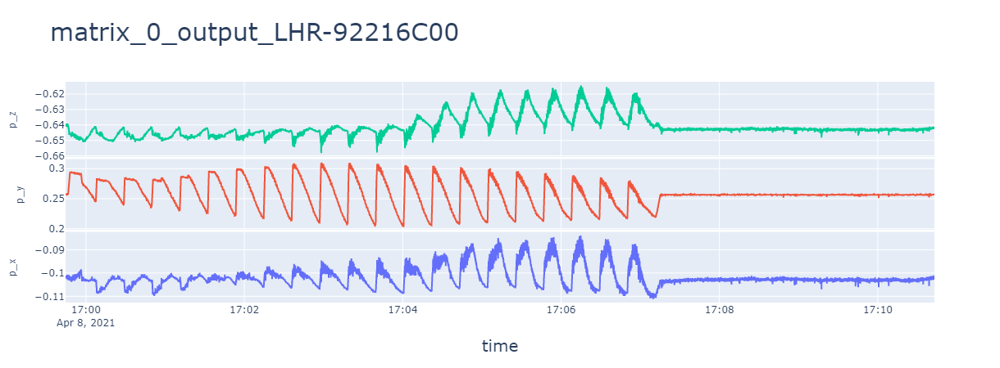

In [6]:
a = pd.read_csv('..\\platform_tests_first_part\\matrix_0\\matrix_0_output_LHR-92216C00.csv', sep=';')
temp = np.array(a.Position.map(lambda a: get_vec(a)).to_list()).transpose()
plot_three_columns('matrix_0_output_LHR-92216C00', 'time', 'p_x', 'p_y', 'p_z', a.Timestamp, temp[0], temp[1], temp[2])

Convert quaternions to euler angles, drop columns with veloсity and angular velocity, convert positions and rotations from absolute to relative 

In [7]:
first_part_dir = "..\platform_tests_first_part"
second_part_dir = "..\platform_tests_second_part"
tracker1 = 'LHR-830CB0D1'
tracker2 = 'LHR-92216C00'

create_new_experiment_dirs(first_part_dir)
create_new_experiment_dirs(second_part_dir)

In [8]:
first_outs, first_map = map_outputs([tracker1, tracker2], *get_output_files(first_part_dir))
second_outs, second_map = map_outputs([tracker1, tracker2], *get_output_files(second_part_dir))

In [9]:
second_outs

{'LHR-830CB0D1': ['..\\platform_tests_second_part\\matrix_-100\\matrix_-100_output_LHR-830CB0D1.csv',
  '..\\platform_tests_second_part\\matrix_-30\\matrix_-30_output_LHR-830CB0D1.csv',
  '..\\platform_tests_second_part\\matrix_-70\\matrix_-70_output_LHR-830CB0D1.csv',
  '..\\platform_tests_second_part\\matrix_100\\matrix_100_output_LHR-830CB0D1.csv',
  '..\\platform_tests_second_part\\matrix_30\\matrix_30_output_LHR-830CB0D1.csv',
  '..\\platform_tests_second_part\\matrix_70\\matrix_70_output_LHR-830CB0D1.csv'],
 'LHR-92216C00': ['..\\platform_tests_second_part\\matrix_-100\\matrix_-100_output_LHR-92216C00.csv',
  '..\\platform_tests_second_part\\matrix_-30\\matrix_-30_output_LHR-92216C00.csv',
  '..\\platform_tests_second_part\\matrix_-70\\matrix_-70_output_LHR-92216C00.csv',
  '..\\platform_tests_second_part\\matrix_100\\matrix_100_output_LHR-92216C00.csv',
  '..\\platform_tests_second_part\\matrix_30\\matrix_30_output_LHR-92216C00.csv',
  '..\\platform_tests_second_part\\matrix_70\

In [10]:
t1p, t1r = get_origins('..\\platform_tests_second_part\\steady_0\\steady_0_output_LHR-830CB0D1.csv')
t2p, t2r = get_origins('..\\platform_tests_second_part\\steady_0\\steady_0_output_LHR-92216C00.csv')

second_position_origins = {tracker1: t1p, tracker2: t2p}
second_rotation_origins = {tracker1: t1r, tracker2: t2r}

for key, values in second_outs.items():
    for v in values:
        a = pd.read_csv(v, sep=';')
        a.Position = a.Position.map(lambda x: vec2str(np.array(get_vec(x) - second_position_origins[key]), True))
        a.Rotation = a.Rotation.map(lambda a: vec2str(np.array(Quaternion.from_str(a).to_euler_angles - second_rotation_origins[key])))
        a.drop('AngularVelocity', inplace=True, axis=1)
        a.drop('Velocity', inplace=True, axis=1)
        a.to_csv(second_map[v], sep=';', index=False)
        print(f'{v} -> {second_map[v]}')

..\platform_tests_second_part\matrix_-100\matrix_-100_output_LHR-830CB0D1.csv -> ..\platform_tests_second_part_euler\matrix_-100\matrix_-100_output_LHR-830CB0D1.csv
..\platform_tests_second_part\matrix_-30\matrix_-30_output_LHR-830CB0D1.csv -> ..\platform_tests_second_part_euler\matrix_-30\matrix_-30_output_LHR-830CB0D1.csv
..\platform_tests_second_part\matrix_-70\matrix_-70_output_LHR-830CB0D1.csv -> ..\platform_tests_second_part_euler\matrix_-70\matrix_-70_output_LHR-830CB0D1.csv
..\platform_tests_second_part\matrix_100\matrix_100_output_LHR-830CB0D1.csv -> ..\platform_tests_second_part_euler\matrix_100\matrix_100_output_LHR-830CB0D1.csv
..\platform_tests_second_part\matrix_30\matrix_30_output_LHR-830CB0D1.csv -> ..\platform_tests_second_part_euler\matrix_30\matrix_30_output_LHR-830CB0D1.csv
..\platform_tests_second_part\matrix_70\matrix_70_output_LHR-830CB0D1.csv -> ..\platform_tests_second_part_euler\matrix_70\matrix_70_output_LHR-830CB0D1.csv
..\platform_tests_second_part\matrix_-

In [11]:
first_outs

{'LHR-830CB0D1': ['..\\platform_tests_first_part\\matrix_-20\\matrix_-20_output_LHR-830CB0D1.csv',
  '..\\platform_tests_first_part\\matrix_-50\\matrix_-50_output_LHR-830CB0D1.csv',
  '..\\platform_tests_first_part\\matrix_0\\matrix_0_output_LHR-830CB0D1.csv',
  '..\\platform_tests_first_part\\matrix_20\\matrix_20_output_LHR-830CB0D1.csv',
  '..\\platform_tests_first_part\\matrix_50\\matrix_50_output_LHR-830CB0D1.csv'],
 'LHR-92216C00': ['..\\platform_tests_first_part\\matrix_-20\\matrix_-20_output_LHR-92216C00.csv',
  '..\\platform_tests_first_part\\matrix_-50\\matrix_-50_output_LHR-92216C00.csv',
  '..\\platform_tests_first_part\\matrix_0\\matrix_0_output_LHR-92216C00.csv',
  '..\\platform_tests_first_part\\matrix_20\\matrix_20_output_LHR-92216C00.csv',
  '..\\platform_tests_first_part\\matrix_50\\matrix_50_output_LHR-92216C00.csv']}

In [12]:
t1p, t1r = get_origins('..\\platform_tests_first_part\\steady_0\\steady_0_output_LHR-830CB0D1.csv')
t2p, t2r = get_origins('..\\platform_tests_first_part\\steady_0\\steady_0_output_LHR-92216C00.csv')

first_position_origins = {tracker1: t1p, tracker2: t2p}
first_rotation_origins = {tracker1: t1r, tracker2: t2r}

for key, values in first_outs.items():
    for v in values:
        a = pd.read_csv(v, sep=';')
        a.Position = a.Position.map(lambda x: vec2str(np.array(get_vec(x) - first_position_origins[key]), True))
        a.Rotation = a.Rotation.map(lambda a: vec2str(np.array(Quaternion.from_str(a).to_euler_angles - first_rotation_origins[key])))
        a.drop('AngularVelocity', inplace=True, axis=1)
        a.drop('Velocity', inplace=True, axis=1)
        a.to_csv(first_map[v], sep=';', index=False)
        print(f'{v} -> {first_map[v]}')

..\platform_tests_first_part\matrix_-20\matrix_-20_output_LHR-830CB0D1.csv -> ..\platform_tests_first_part_euler\matrix_-20\matrix_-20_output_LHR-830CB0D1.csv
..\platform_tests_first_part\matrix_-50\matrix_-50_output_LHR-830CB0D1.csv -> ..\platform_tests_first_part_euler\matrix_-50\matrix_-50_output_LHR-830CB0D1.csv
..\platform_tests_first_part\matrix_0\matrix_0_output_LHR-830CB0D1.csv -> ..\platform_tests_first_part_euler\matrix_0\matrix_0_output_LHR-830CB0D1.csv
..\platform_tests_first_part\matrix_20\matrix_20_output_LHR-830CB0D1.csv -> ..\platform_tests_first_part_euler\matrix_20\matrix_20_output_LHR-830CB0D1.csv
..\platform_tests_first_part\matrix_50\matrix_50_output_LHR-830CB0D1.csv -> ..\platform_tests_first_part_euler\matrix_50\matrix_50_output_LHR-830CB0D1.csv
..\platform_tests_first_part\matrix_-20\matrix_-20_output_LHR-92216C00.csv -> ..\platform_tests_first_part_euler\matrix_-20\matrix_-20_output_LHR-92216C00.csv
..\platform_tests_first_part\matrix_-50\matrix_-50_output_LHR-